In [1]:
import glob
import random
import os
import numpy as np
import gc

import cv2
from PIL import Image

import albumentations as A

from torchvision import datasets
from torchvision.utils import save_image, make_grid
from torch.autograd import Variable
from torch.utils.data import DataLoader, Dataset
import torchvision.transforms as transforms

import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optimizers
import torch

import math
import itertools
import time
import datetime
import sys

from skimage import color
import matplotlib.pyplot as plt
from torchsummary import summary
from tqdm.notebook import tqdm

## Utils

In [ ]:
def rescale_images(path, img_width, img_height):
    files = os.listdir(path)
    print('Rescaling images...')
    for i,f in enumerate(files):
        f_path = os.path.join(path,f)
        src_img = cv2.imread(f_path)
        src_img = cv2.resize(src_img, (img_width, img_height), interpolation=cv2.INTER_AREA)
        cv2.imwrite(f_path, src_img)
        print(f'{round((i/len(files))*100,2)} %', end='\r')
    print('Images rescaled')

In [2]:
def image_colorfulness(image):
    # SOURCE: https://pyimagesearch.com/2017/06/05/computing-image-colorfulness-with-opencv-and-python/
    (B, G, R) = cv2.split(image.astype("float"))
    rg = np.absolute(R - G)
    yb = np.absolute(0.5 * (R + G) - B)
    (rbMean, rbStd) = (np.mean(rg), np.std(rg))
    (ybMean, ybStd) = (np.mean(yb), np.std(yb))
    stdRoot = np.sqrt((rbStd ** 2) + (ybStd ** 2))
    meanRoot = np.sqrt((rbMean ** 2) + (ybMean ** 2))
    return stdRoot + (0.3 * meanRoot)

def remove_uncolorful_imgs(path, min_colorfulness=10.0):
    print('Removing uncolorful images...')
    files = os.listdir(path)
    for i,f in enumerate(files):

        f_path = os.path.join(path,f)
        src_img = cv2.imread(f_path)

        if src_img is None:
            print(f"Removing {f_path} as it's not a picture")
            os.remove(f_path)
            continue

        colorfulness = image_colorfulness(src_img)
        if colorfulness < min_colorfulness:
            print(f"The following image will be removed: {f_path}")
            plt.imshow(src_img)
            plt.show()
            os.remove(f_path)
        print(f'{round((i/len(files))*100,2)} %', end='\r')
    print('Uncolorful images removed...')

In [3]:
def set_requires_grad(model, requires_grad=True):
    for p in model.parameters():
        p.requires_grad = requires_grad

def init_weights(net, std=0.02):
    
    def init_func(m):
        classname = m.__class__.__name__
        if hasattr(m, 'weight') and 'Conv' in classname:
            nn.init.normal_(m.weight.data, mean=0.0, std=std)
            if hasattr(m, 'bias') and m.bias is not None:
                nn.init.constant_(m.bias.data, 0.0)
        elif 'BatchNorm2d' in classname:
            nn.init.normal_(m.weight.data, 1., std)
            nn.init.constant_(m.bias.data, 0.)
            
    net.apply(init_func)
    print("Model initialized with normal initialization")  
    return net

In [4]:
def tensor_lab_2_np_rgb(tensor_lab):
    np_lab = tensor_lab.cpu().detach().numpy()
    np_lab = np.transpose(np_lab, (1, 2, 0))

    # Denormalize
    np_lab[:,:,0] = np_lab[:,:,0] * 100.0
    np_lab[:,:,1] = np_lab[:,:,1] * 128.0
    np_lab[:,:,2] = np_lab[:,:,2] * 128.0

    # To Rgb
    return color.lab2rgb(np_lab)

def tensor_l_2_np_rgb(tensor_l):
    np_l = tensor_l.cpu().detach().numpy()
    np_l = np.transpose(np_l, (1, 2, 0))
    np_l = np.squeeze(np_l) # (256,256,1) -> (256,256)
    
    # Already in [0,1]

    # To Rgb
    return color.gray2rgb(np_l)

In [5]:
def visualize_training(generator, data, device, save=True):
    
    generator.eval()
    with torch.no_grad():
        L = data['input'].to(device)
        real_ab = data['target'].to(device)
        fake_ab = generator.forward(L).detach()
    generator.train()

    fig = plt.figure(figsize=(15, 8))
    for i in range(4):
        
        real_img = tensor_lab_2_np_rgb(torch.cat((L[i], real_ab[i]), 0))
        fake_img = tensor_lab_2_np_rgb(torch.cat((L[i], fake_ab[i]), 0))
        
        ax = plt.subplot(3, 5, i + 1)
        ax.imshow(L[i][0].cpu(), cmap='gray')
        ax.axis("off")
        ax = plt.subplot(3, 5, i + 1 + 5)
        ax.imshow(fake_img)
        ax.axis("off")
        ax = plt.subplot(3, 5, i + 1 + 10)
        ax.imshow(real_img)
        ax.axis("off")
    plt.show()
    if save:
        fig.savefig(f"colorization_{time.time()}.png")

## Models

### G

In [6]:
from fastai.vision.learner import create_body
from fastai.vision.models.unet import DynamicUnet
from torchvision.models.resnet import resnet18

def res_unet(in_channels=1, out_channels=2, w=256, h=256, pretrained=True, device="cuda"):
    body = create_body(resnet18(), pretrained=pretrained, n_in=in_channels, cut=-2)
    net = DynamicUnet(body, out_channels, (w, h)).to(device)
    return net

In [7]:
def pretrain_G(net_G, criterion_G, opt_G, train_dl, val_dl, epochs, sample_every):
    
    h = {"loss_G":[]}
    
    prev_time = time.time()
    
    batch_count = 0
    for epoch in range(epochs):
        
        avg_loss_g = 0

        for batch in tqdm(train_dl):
            batch_count += 1
            
            # Data
            real_L = batch['input'].to(device)
            real_ab = batch['target'].to(device)
            
            # Pretrain
            opt_G.zero_grad()
            fake_ab = net_G(real_L)
            loss = criterion_G(fake_ab, real_ab)
            loss.backward()
            opt_G.step()
            
            # History
            avg_loss_g += loss.item()
            
            # Sample
            if batch_count % sample_every == 0:
                val_data = next(iter(val_dl))
                visualize_training(net_G, val_data, device, save=True)
                torch.save(net_G.state_dict(), "generator_pretrain.pth")

        avg_loss_g = avg_loss_g / tqdm(train_dl).total
        h["loss_G"].append(avg_loss)
        
        print(f"[Epoch {epoch}/{epochs}]")
        
    print("Generator pretrained!")
    torch.save(net_G.state_dict(), "generator_pretrain.pth")
    
    return h

### D

In [8]:
class conv_net(nn.Module):
    def __init__(self, input_channels=1, target_channels=2):
        super().__init__()

        def discriminator_block(in_filters, out_filters):
            """Returns downsampling layers of each discriminator block"""
            layers = [
                nn.Conv2d(in_filters, out_filters, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False),
                nn.BatchNorm2d(out_filters, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
                nn.LeakyReLU(negative_slope=0.2, inplace=True)
            ]
            return layers

        self.model = nn.Sequential(
            nn.Conv2d(input_channels + target_channels, 64, 4, stride=2, padding=1),
            nn.LeakyReLU(negative_slope=0.2, inplace=True),
            *discriminator_block(64, 128),
            *discriminator_block(128, 256),
            *discriminator_block(256, 512),
            #nn.ZeroPad2d((1, 0, 1, 0)),
            nn.Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1))
        )

    def forward(self, input_img, target_img):
        # Concatenate image and condition image by channels to produce input
        input_tensor = torch.cat((input_img, target_img), 1)
        return self.model(input_tensor)

### GAN

In [9]:
def train_D(net_D, criterion_D, opt_D, real_L, real_ab, fake_ab, device):
    net_D.train() # set train mode
    set_requires_grad(net_D, True)
    opt_D.zero_grad()
    
    preds = net_D.forward(real_L.detach(), fake_ab.detach())
    labels = torch.tensor(0.0).expand_as(preds).to(device)
    loss_D_fake = criterion_D(preds, labels)
    
    preds = net_D.forward(real_L.detach(), real_ab.detach())
    labels = torch.tensor(1.0).expand_as(preds).to(device)
    loss_D_real = criterion_D(preds, labels)
    
    loss_D = (loss_D_fake + loss_D_real) * 0.5
    
    loss_D.backward()  
    opt_D.step()
    
    return loss_D.item()

def train_G(net_G, net_D, criterion_G, criterion_D, opt_G, real_L, real_ab, fake_ab, lambda_L1, device):
    net_G.train() # set train mode
    set_requires_grad(net_D, False)
    opt_G.zero_grad()
    
    preds = net_D(real_L.detach(), fake_ab.detach())
    labels = torch.tensor(1.0).expand_as(preds).to(device) # as they were real
    loss_D = criterion_D(preds, labels)
    
    loss_G = criterion_G(fake_ab, real_ab)
    loss_GAN = loss_D + loss_G * lambda_L1
    
    loss_GAN.backward()
    opt_G.step()
    
    return loss_G.item(), loss_GAN.item()

def train_GAN(net_G, net_D, criterion_G, criterion_D, opt_G, opt_D, train_dl, val_dl, lambda_L1, epochs, device="cuda", sample_every=200):
    
    h = {"loss_G":[], "loss_D":[], "loss_GAN":[]}
    
    batch_count = 0
    for e in range(epochs):
        
        avg_loss_g = 0
        avg_loss_d = 0
        avg_loss_gan = 0
        
        for data in tqdm(train_dl):
            
            # Data
            real_L = data['input'].to(device)
            real_ab = data['target'].to(device)
            
            # Inference
            fake_ab = net_G.forward(real_L)
            
            # Train
            loss_D = train_D(net_D, criterion_D, opt_D, real_L, real_ab, fake_ab, device)
            loss_G, loss_GAN = train_G(net_G, net_D, criterion_G, criterion_D, opt_G, real_L, real_ab, fake_ab, lambda_L1, device)

            # History
            avg_loss_g += loss_G
            avg_loss_d += loss_D
            avg_loss_gan += loss_GAN
            
            # Sample
            batch_count += 1
            if batch_count % sample_every == 0:
                val_data = next(iter(val_dl))
                visualize_training(net_G, val_data, device, save=True)
                torch.save(net_G.state_dict(), "generator_train.pth")
                torch.save(net_D.state_dict(), "discriminator_train.pth")
        
        avg_loss_g = avg_loss_g / len(real_L)
        avg_loss_d = avg_loss_d / len(real_L)
        avg_loss_gan = avg_loss_gan / len(real_L)
        
        h["loss_G"].append(avg_loss_g)
        h["loss_D"].append(avg_loss_d)
        h["loss_GAN"].append(avg_loss_gan)
        
        np.save("tmp_train_history.npy", h)
        
        print(f"[Epoch {e}/{epochs}]")
        
    return h

## Data

In [ ]:
#path = "..\\data\\coco" #(7750)
path = "..\\data\\groups" #(4902)

#train_size = 7700
train_size = 4850

img_height = 256
img_width = 256

#rescale_images(path, img_width, img_height)
#remove_uncolorful_imgs(path, 10.0)

files = os.listdir(path)
print(f'FILES:{len(files)}')

random.seed(111)
random.shuffle(files)

val_size = len(files) - train_size

train_paths = [os.path.join(path,f) for f in files[:train_size]]
val_paths = [os.path.join(path,f) for f in files[val_size:]]

demo = False
if demo: 
    _, axes = plt.subplots(4, 4, figsize=(10, 10))
    for ax, img_path in zip(axes.flatten(), train_paths):
        ax.imshow(Image.open(img_path))
        ax.axis("off")

In [11]:
class CustomDataset(Dataset):
    def __init__(self, paths, width, height, train=True):   # initial logic happens like transform
        
        self.transforms = transforms.Compose([
            transforms.Resize((width, height), Image.BICUBIC),
            transforms.RandomHorizontalFlip()
        ])
        
        self.paths = paths
        self.size = len(self.paths)

        print(f"Dataset initialized: {self.size} files")
        
    def __getitem__(self, index):

        # Load to numpy matrix
        rgb = Image.open(self.paths[index])
        rgb = self.transforms(rgb)
        np_rgb = np.array(rgb)
        np_lab = color.rgb2lab(np_rgb).astype("float32")
        
        # Normalize
        np_lab[:,:,0] = np_lab[:,:,0] / 100.0 # [0,100] -> [0,1]
        np_lab[:,:,1] = np_lab[:,:,1] / 128.0 # [-128,128] -> [-1,1]
        np_lab[:,:,2] = np_lab[:,:,2] / 128.0 # [-128,128] -> [-1,1]

        # Load to tensor
        tensor_lab = transforms.ToTensor()(np_lab)
        
        L = tensor_lab[0:1,:,:]
        ab = tensor_lab[1:,:,:]

        return {"input": L, "target": ab}

    def __len__(self):
        return self.size

In [12]:
batch_size = 4

img_height = 256
img_width = 256

n_cpu = 0

os.makedirs("saved_images", exist_ok=True)
os.makedirs("saved_models", exist_ok=True)

train_dl = DataLoader(
    CustomDataset(train_paths, img_width, img_height, train=True),
    batch_size=batch_size,
    shuffle=True,
    num_workers=n_cpu,
)

val_dl = DataLoader(
    CustomDataset(val_paths, img_width, img_height, train=False),
    batch_size=5,
    shuffle=True,
    num_workers=n_cpu,
)

demo = False
if demo:
    train_data = next(iter(train_dl))
    print(train_data['input'].shape)
    print(train_data['target'].shape)

Dataset initialized: 7700 files
Dataset initialized: 7700 files


C:\Users\Admin\.conda\envs\rna\lib\site-packages\torchvision\transforms\transforms.py:333: UserWarning: Argument interpolation should be of type InterpolationMode instead of int. Please, use InterpolationMode enum.
  "Argument interpolation should be of type InterpolationMode instead of int. "


## Pre-Pre-Train

In [13]:
cuda = True if torch.cuda.is_available() else False

if cuda:
    gc.collect()
    torch.cuda.empty_cache()
    device="cuda"
else:
    device="cpu"

Tensor = torch.cuda.FloatTensor if cuda else torch.FloatTensor

In [14]:
#".\\weights\\{dataset}\\{model_setp_epochs}.pth"
net_g_initial_weights = ".\\weights\\coco\\generator_train_100epochs.pth" 
net_d_initial_weights = ".\\weights\\coco\\discriminator_train_100epochs.pth"

lr_G = 2e-4
lr_D = 2e-4
beta1 = 0.5
beta2 = 0.999
lambda_L1 = 100.0

In [15]:
# Crear net_G
net_G = res_unet(in_channels=1, out_channels=2, w=img_width, h=img_height, pretrained=True, device=device)

if net_g_initial_weights != None:
    net_G.load_state_dict(torch.load(net_g_initial_weights, map_location=device))
else:
    net_G = init_weights(net_G)
    
# Criterion
criterion_G = nn.L1Loss().to(device)

# Optimizer
opt_G = optimizers.Adam(net_G.parameters(), lr=lr_G, betas=(beta1, beta2))

# Summary
summary(net_G, (1, img_width, img_height))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 128, 128]           3,136
       BatchNorm2d-2         [-1, 64, 128, 128]             128
              ReLU-3         [-1, 64, 128, 128]               0
         MaxPool2d-4           [-1, 64, 64, 64]               0
            Conv2d-5           [-1, 64, 64, 64]          36,864
       BatchNorm2d-6           [-1, 64, 64, 64]             128
              ReLU-7           [-1, 64, 64, 64]               0
            Conv2d-8           [-1, 64, 64, 64]          36,864
       BatchNorm2d-9           [-1, 64, 64, 64]             128
             ReLU-10           [-1, 64, 64, 64]               0
       BasicBlock-11           [-1, 64, 64, 64]               0
           Conv2d-12           [-1, 64, 64, 64]          36,864
      BatchNorm2d-13           [-1, 64, 64, 64]             128
             ReLU-14           [-1, 64,

In [16]:
# Crear net_D
net_D = conv_net(input_channels=1, target_channels=2)
net_D = net_D.to(device)

if net_d_initial_weights != None:
    net_D.load_state_dict(torch.load(net_d_initial_weights, map_location=device))
else:
    net_D = init_weights(net_D)
    
# Criterion
criterion_D = nn.BCEWithLogitsLoss().to(device) #nn.MSELoss()

# Optimizer
opt_D = optimizers.Adam(net_D.parameters(), lr=lr_D, betas=(beta1, beta2))

# Summary
summary(net_D, [(1, img_width, img_height), (2, img_width, img_height)])

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 128, 128]           3,136
         LeakyReLU-2         [-1, 64, 128, 128]               0
            Conv2d-3          [-1, 128, 64, 64]         131,072
       BatchNorm2d-4          [-1, 128, 64, 64]             256
         LeakyReLU-5          [-1, 128, 64, 64]               0
            Conv2d-6          [-1, 256, 32, 32]         524,288
       BatchNorm2d-7          [-1, 256, 32, 32]             512
         LeakyReLU-8          [-1, 256, 32, 32]               0
            Conv2d-9          [-1, 512, 16, 16]       2,097,152
      BatchNorm2d-10          [-1, 512, 16, 16]           1,024
        LeakyReLU-11          [-1, 512, 16, 16]               0
           Conv2d-12            [-1, 1, 15, 15]           8,193
Total params: 2,765,633
Trainable params: 2,765,633
Non-trainable params: 0
---------------------------

## Pre-Train

In [17]:
do_pretrain = False

if do_pretrain:
    pretrain_epochs = 20
    sample_every = math.floor(train_size / batch_size)
    pretrain_h = pretrain_G(net_G, criterion_G, opt_G, train_dl, val_dl, pretrain_epochs, sample_every)
    np.save("pretrain_history.npy", h)

## Train

  0%|          | 0/1925 [00:00<?, ?it/s]

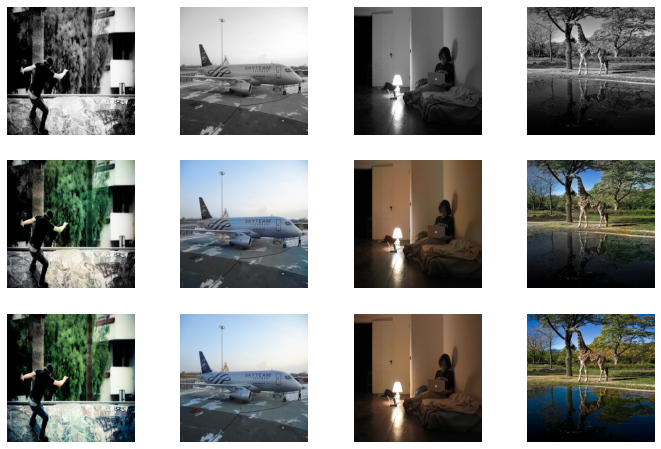

[Epoch 0/25]


  0%|          | 0/1925 [00:00<?, ?it/s]

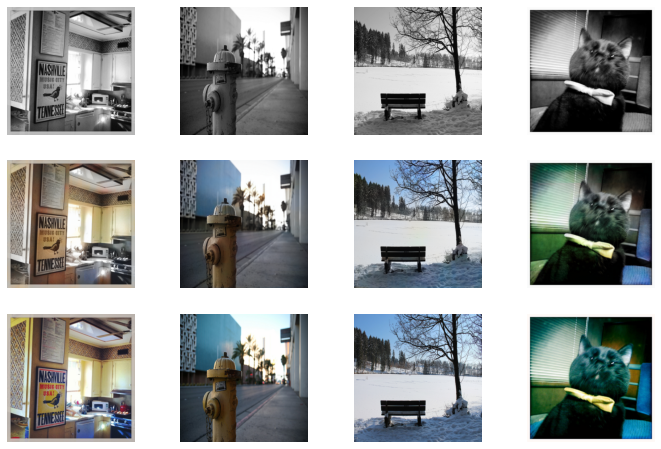

[Epoch 1/25]


  0%|          | 0/1925 [00:00<?, ?it/s]

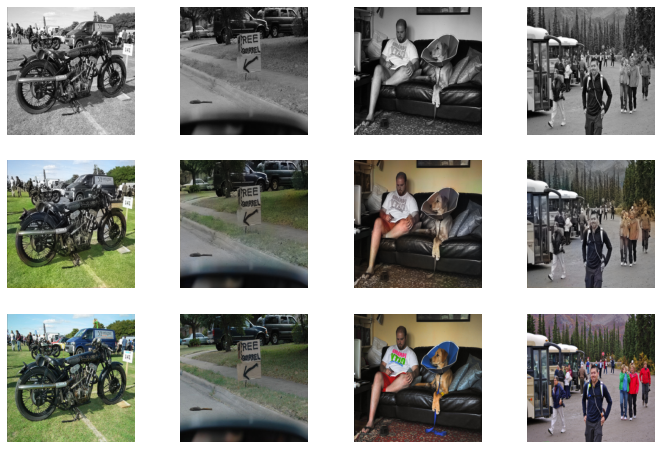

[Epoch 2/25]


  0%|          | 0/1925 [00:00<?, ?it/s]

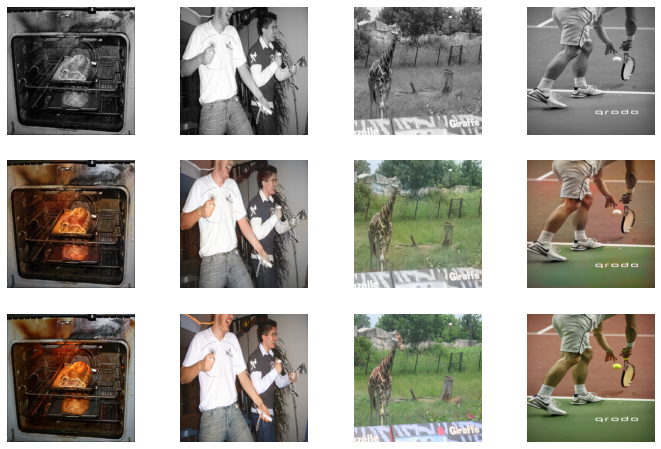

[Epoch 3/25]


  0%|          | 0/1925 [00:00<?, ?it/s]

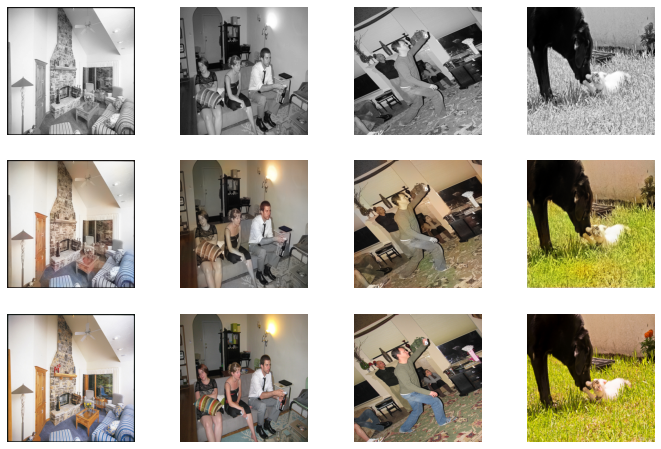

[Epoch 4/25]


  0%|          | 0/1925 [00:00<?, ?it/s]

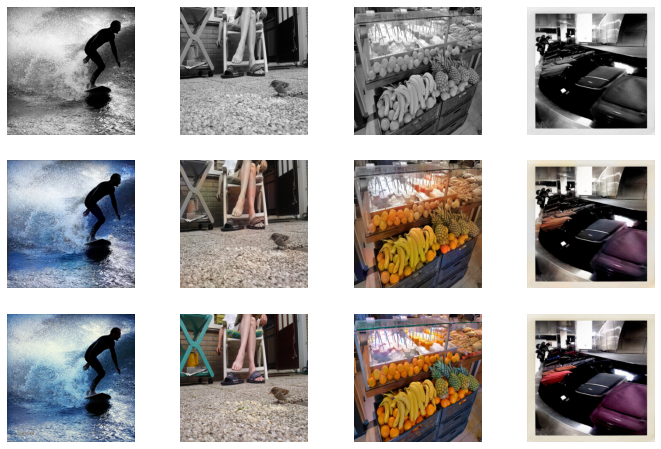

[Epoch 5/25]


  0%|          | 0/1925 [00:00<?, ?it/s]

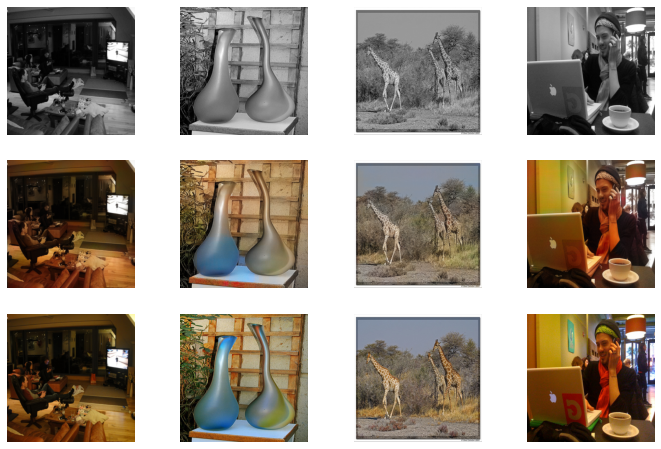

[Epoch 6/25]


  0%|          | 0/1925 [00:00<?, ?it/s]

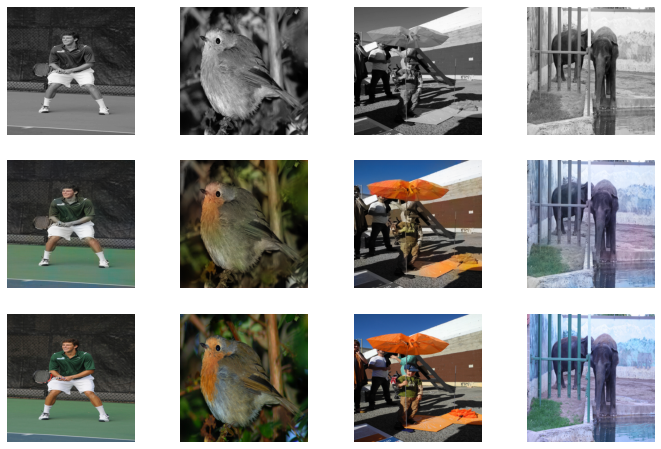

[Epoch 7/25]


  0%|          | 0/1925 [00:00<?, ?it/s]

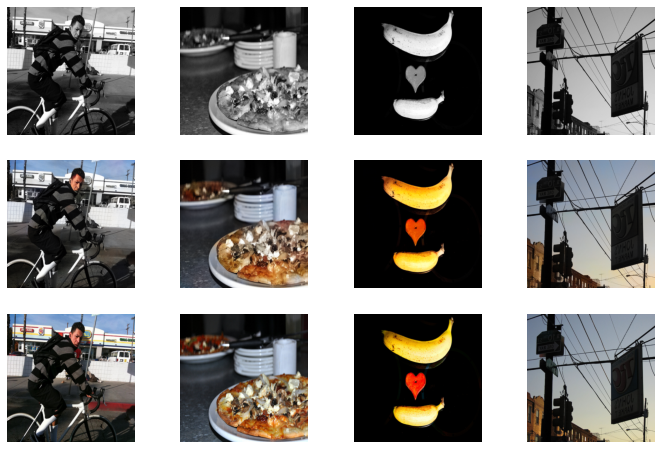

[Epoch 8/25]


  0%|          | 0/1925 [00:00<?, ?it/s]

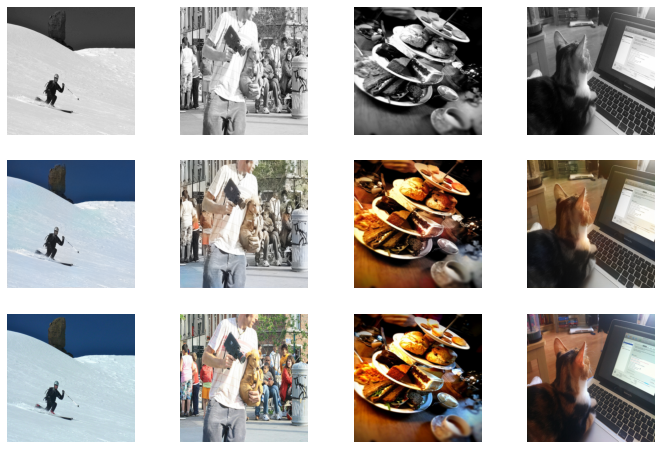

[Epoch 9/25]


  0%|          | 0/1925 [00:00<?, ?it/s]

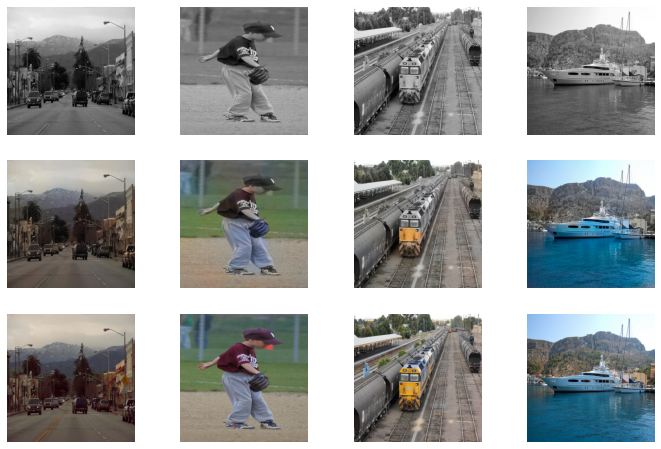

[Epoch 10/25]


  0%|          | 0/1925 [00:00<?, ?it/s]

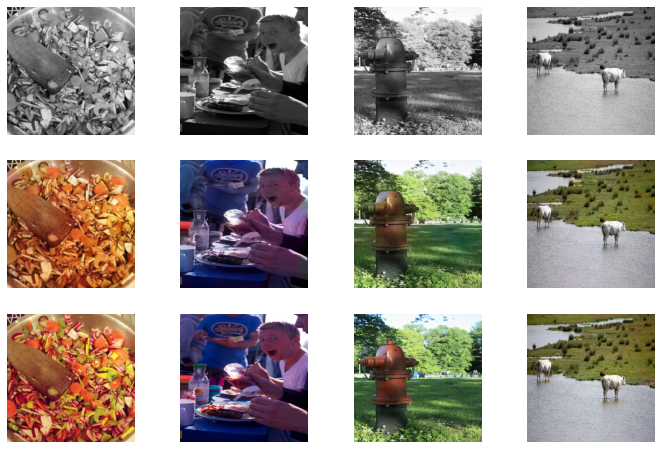

[Epoch 11/25]


  0%|          | 0/1925 [00:00<?, ?it/s]

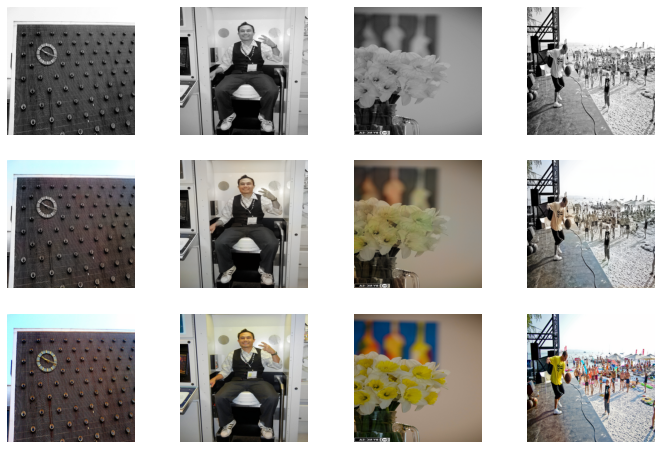

[Epoch 12/25]


  0%|          | 0/1925 [00:00<?, ?it/s]

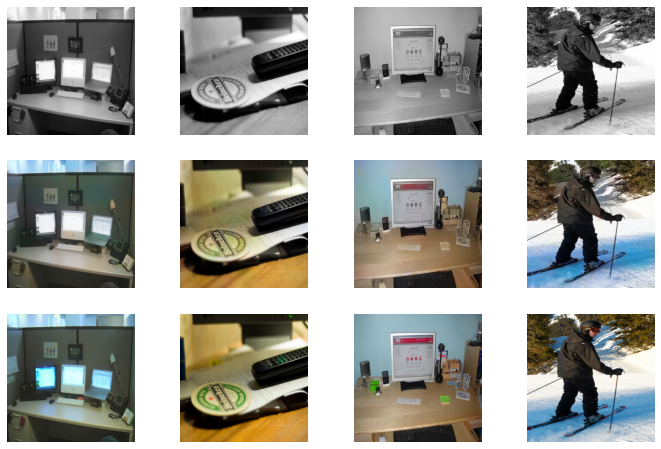

[Epoch 13/25]


  0%|          | 0/1925 [00:00<?, ?it/s]

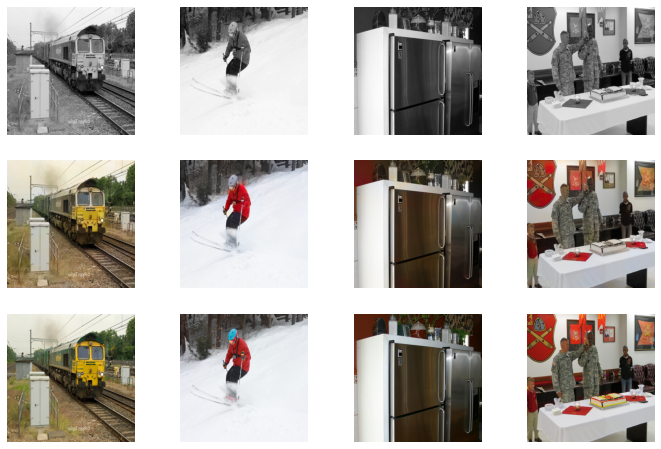

[Epoch 14/25]


  0%|          | 0/1925 [00:00<?, ?it/s]

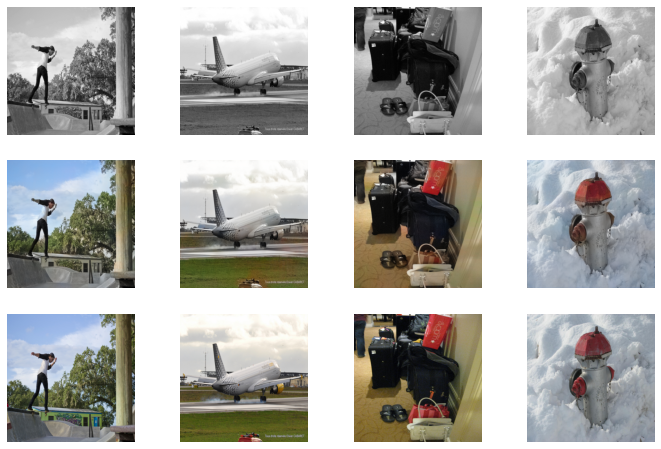

[Epoch 15/25]


  0%|          | 0/1925 [00:00<?, ?it/s]

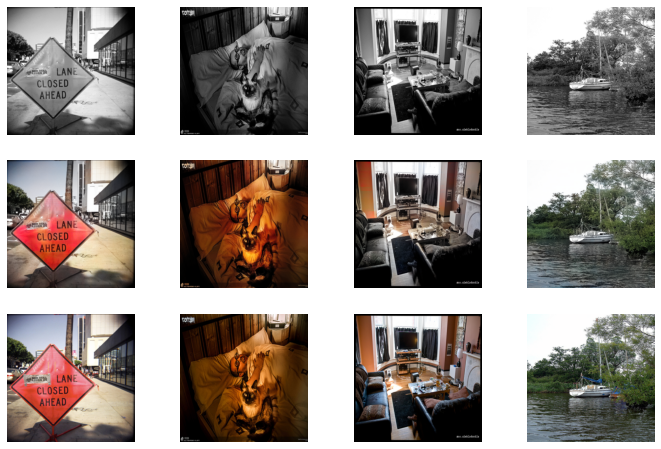

[Epoch 16/25]


  0%|          | 0/1925 [00:00<?, ?it/s]

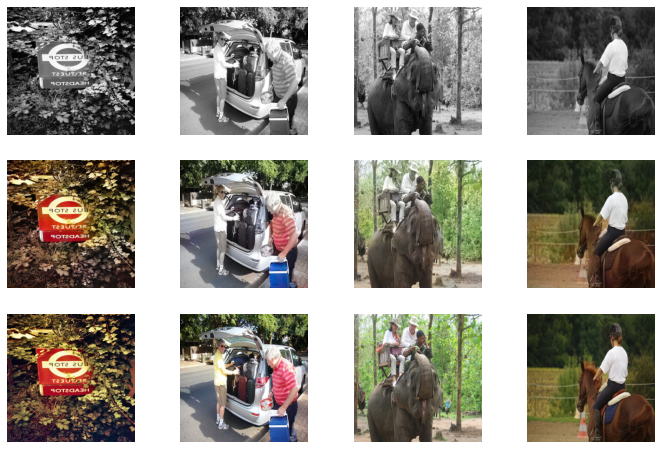

[Epoch 17/25]


  0%|          | 0/1925 [00:00<?, ?it/s]

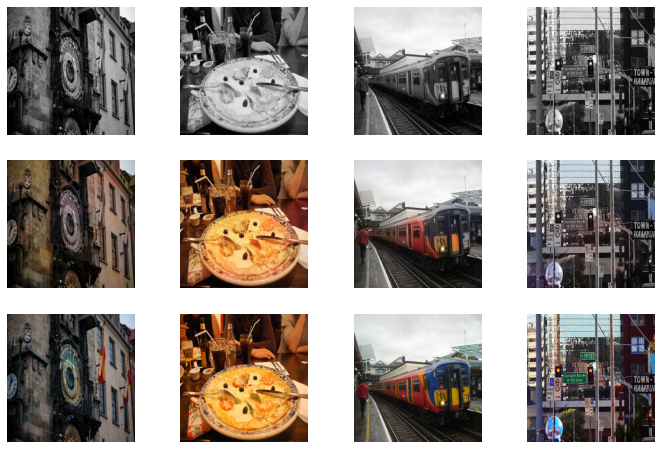

[Epoch 18/25]


  0%|          | 0/1925 [00:00<?, ?it/s]

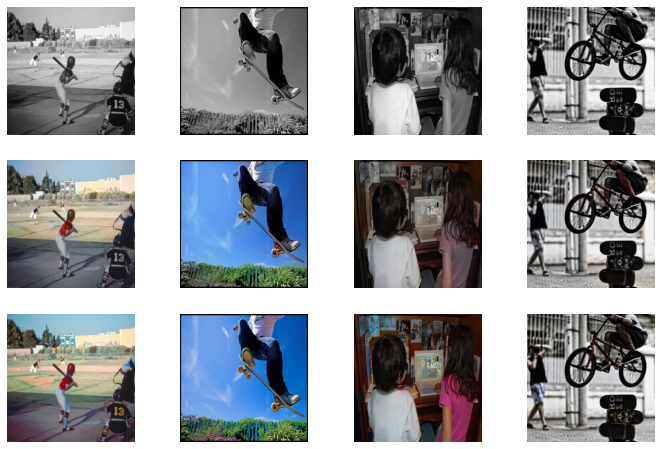

[Epoch 19/25]


  0%|          | 0/1925 [00:00<?, ?it/s]

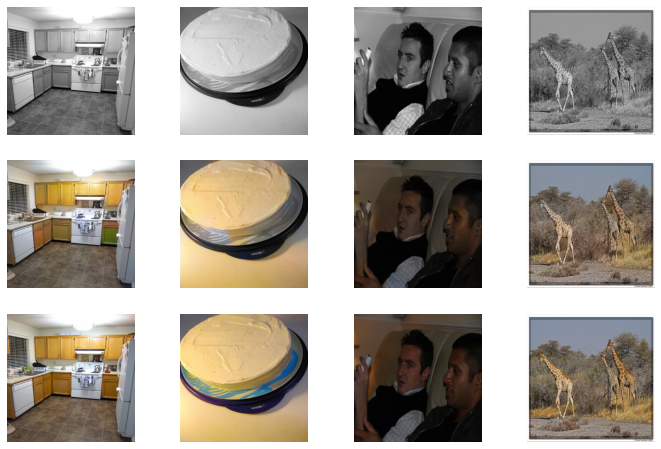

[Epoch 20/25]


  0%|          | 0/1925 [00:00<?, ?it/s]

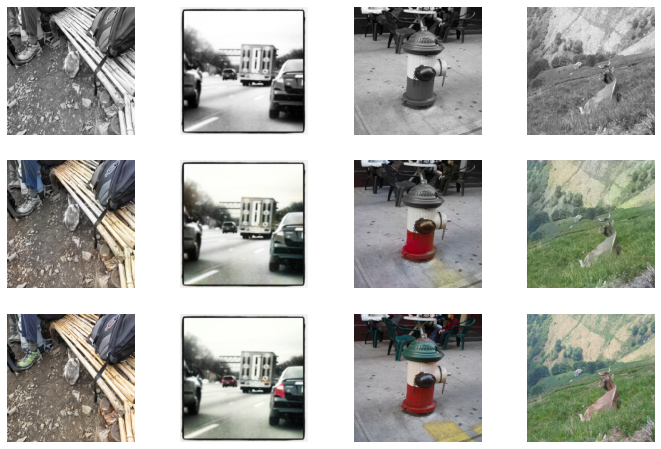

[Epoch 21/25]


  0%|          | 0/1925 [00:00<?, ?it/s]

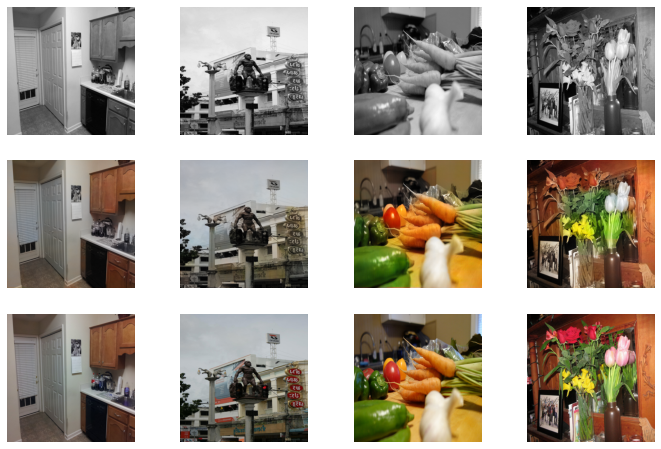

[Epoch 22/25]


  0%|          | 0/1925 [00:00<?, ?it/s]

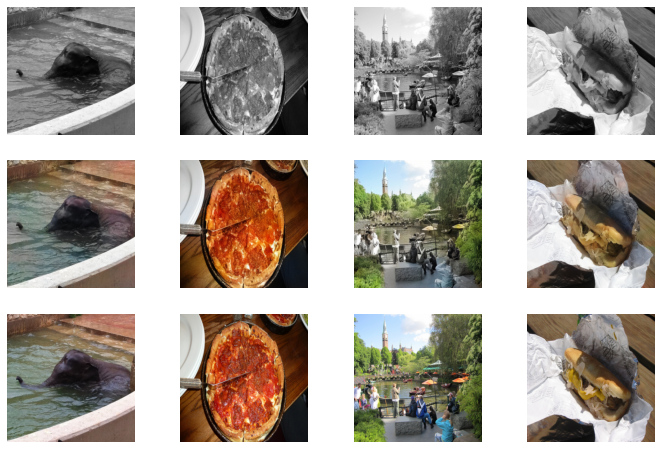

[Epoch 23/25]


  0%|          | 0/1925 [00:00<?, ?it/s]

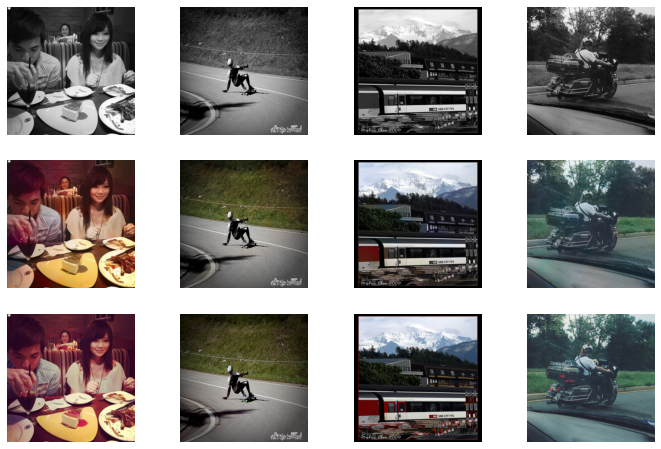

[Epoch 24/25]


NameError: name 'h' is not defined

In [18]:
do_train = True

if do_train:
    train_epochs = 100
    sample_every = math.floor(train_size / batch_size)
    train_h = train_GAN(net_G, net_D, criterion_G, criterion_D, opt_G, opt_D, train_dl, val_dl, lambda_L1, train_epochs, device=device, sample_every=sample_every)
    np.save("final_train_history.npy", train_h)

## Use

In [ ]:
def PicToTensor(rgb):
    # Load to numpy matrix
    rgb = transforms.Resize((img_width, img_height), Image.BICUBIC)(rgb)
    np_rgb = np.array(rgb)
    np_lab = color.rgb2lab(np_rgb).astype("float32")

    # Normalize
    np_lab[:,:,0] = np_lab[:,:,0] / 100.0 # [0,100] -> [0,1]
    np_lab[:,:,1] = np_lab[:,:,1] / 128.0 # [-128,128] -> [-1,1]
    np_lab[:,:,2] = np_lab[:,:,2] / 128.0 # [-128,128] -> [-1,1]

    # Load to tensor
    tensor_lab = transforms.ToTensor()(np_lab)

    L = tensor_lab[0:1,:,:]
    ab = tensor_lab[1:,:,:]
    
    L_batch = torch.stack([L])
    ab_batch = torch.stack([ab])

    return {"input": L_batch, "target": ab_batch}

def Show(L, ab, original_w, original_h):
    grey = tensor_l_2_np_rgb(L)
    rgb = tensor_lab_2_np_rgb(torch.cat((L, ab), 0))
    
    grey = cv2.resize(grey, dsize=(original_w, original_h), interpolation=cv2.INTER_CUBIC)
    plt.figure(figsize=(20,20))
    plt.axis('off')
    plt.imshow(grey)
    plt.show()
    
    rgb = cv2.resize(rgb, dsize=(original_w, original_h), interpolation=cv2.INTER_CUBIC)
    plt.figure(figsize=(20,20))
    plt.axis('off')
    plt.imshow(rgb)
    plt.show()
    

In [ ]:
pic_path = ".\\your_folder\\your_image.jpg"
rgb = Image.open(pic_path)
original_w, original_h = rgb.size

data = PicToTensor(rgb)

real_L = data['input'].to(device)
real_ab = data['target'].to(device)

net_G.eval()
fake_ab = net_G.forward(real_L)
net_G.train()

Show(real_L[0], fake_ab[0], original_w, original_h)